## Lake Tahoe West
## Landscape Resilience Assessment - Methods
The assessment was developed through a highly collaborative process with a diverse group of stakeholders from a variety of organizations with complementary expertise. The assessment used the best available data to describe the current condition of the natural environment of the west side of the Lake Tahoe Basin, and the resilience of those environmental characteristics, values, and ecosystem services to a variety of disturbances.

The Landscape Resilience Assessment evaluated the current condition of the natural environment of the west side of the Lake Tahoe Basin and the resilience of those environmental characteristics, values and ecosystem services to a variety of disturbances. Through an iterative process, with stakeholder and scientist input, the Interagency Design Team selected ecological and sociological landscape values and services, and primary disturbances that are important to understand the current state of resilience of the west shore. Using the best available quantitative and spatially-explicit data, the Design Team compared current conditions to historic and/or contemporary reference conditions to determine which portions of the landscape and which landscape values and services are the least resilient to disturbances.

### Import Packages

In [9]:
import arcpy
from arcpy import *
from arcpy.sa import *
from arcpy.da import *
from arcgis.gis import GIS
import plotly as py
import plotly.graph_objs as go
import ipywidgets as widgets
import numpy as np
py.offline.init_notebook_mode(connected=True) 
gis = GIS("http://trpa.maps.arcgis.com", "mbindl", "Ma$eatwork17")
Ecobject = 'C:/GIS/PROJECT/LakeTahoeWest/Data/ProjectData.gdb/LTW_Ecobject'
env.workspace = 'C:/GIS/PROJECT/LakeTahoeWest/Data/AnalysisData.gdb'
projectgdb = 'C:/GIS/PROJECT/LakeTahoeWest/Data/ProjectData.gdb'

### List Fields with Type and Length

In [2]:
# For each field in the Hospitals feature class, print
#  the field name, type, and length.
# For each field in the Hospitals feature class, print
#  the field name, type, and length.
fields = arcpy.ListFields(Ecobject)

for field in fields:
    print("{0} is a type of {1} with a length of {2}"
          .format(field.name, field.type, field.length))

OBJECTID is a type of OID with a length of 4
Shape is a type of Geometry with a length of 0
ECOREGION_DOMAIN is a type of String with a length of 4
ECOREGION_DIVISION is a type of String with a length of 3
ECOREGION_PROVINCE is a type of String with a length of 4
ECOREGION_SECTION is a type of String with a length of 5
ECOREGION_SUBSECTION is a type of String with a length of 6
CALVEGZONE is a type of String with a length of 1
TILE is a type of String with a length of 3
COVERTYPE is a type of String with a length of 3
REGIONAL_DOMINANCE_TYPE_1 is a type of String with a length of 3
OS_TREE_DIAMETER_CLASS_1 is a type of String with a length of 2
REGIONAL_DOMINANCE_TYPE_2 is a type of String with a length of 3
OS_TREE_DIAMETER_CLASS_2 is a type of String with a length of 2
REGIONAL_DOMINANCE_TYPE_3 is a type of String with a length of 2
CON_CFA is a type of String with a length of 2
HDW_CFA is a type of String with a length of 2
SHB_CFA is a type of String with a length of 2
HEB_CFA is a

### List Field Values

In [3]:
field = 'SpatialVar'
# Use SearchCursor with list comprehension to return a
# unique set of values in the specified field
values = [row[0] for row in SearchCursor(Ecobject, field)]
uniqueValues = set(values)

print(uniqueValues)

{'Clump', 'Scattered Clump', 'Open', 'Dense Clump', 'Sparse', 'N/A', 'water', 'Individual', 'river', 'Stand Initiation'}


### Delete Field

In [4]:
# Available vairalbes
# DeleteField_management (in_table, drop_field)
# documentation: http://pro.arcgis.com/en/pro-app/tool-reference/data-management/delete-field.htm

# Set local variables
dropFields = ["", "", ""]
# Execute DeleteField
arcpy.DeleteField_management(Ecobject, dropFields)

TypeError: 'module' object is not callable

TypeError: 'module' object is not callable

TypeError: 'module' object is not callable

TypeError: 'module' object is not callable

TypeError: 'module' object is not callable

TypeError: 'module' object is not callable

<Result 'C:/GIS/PROJECT/LakeTahoeWest/Data/ProjectData.gdb/LTW_Ecobject'>

### Add New Field

In [ ]:
# Available variables
# AddField_management (in_table, field_name, field_type, {field_precision}, {field_scale}, 
# {field_length}, {field_alias}, {field_is_nullable}, {field_is_required}, {field_domain})
# documentation: http://pro.arcgis.com/en/pro-app/tool-reference/data-management/add-field.htm

# Set local variables
fieldName = ""
fieldType = ""

fieldPrecision = ""
fieldScale = ""
fieldLength = ""
fieldAlias = ""



# Execute AddField twice for two new fields
arcpy.AddField_management(Ecobject, fieldName, fieldType, fieldPrecision, fieldScale,
                          fieldAlias, field_is_nullable="NULLABLE")

### Display Histogram of Field Values

In [14]:
field = 'REGIONAL_DOMINANCE_TYPE_1'
arr = FeatureClassToNumPyArray(Ecobject, field)
data = [go.Histogram(x=arr[field])]
py.offline.iplot(data, filename='WHRTYPE Histogram')

### List unique combinations of values for multiple fields.

In [6]:
fields = ['LMU', 'WHRTYPE']
with SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        print(u'{0}, {1}'.format(row[0], row[1]))

1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, BAR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
6 

4 - Midslope NE, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, 

2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope

4 - Midslope NE, > 30% Slope, MCP
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, MCP
4 - Midslope NE, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, MCP
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, MCP
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, MRI
3 - Midslope NE, < 30% Slope, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, MRI
2 - Canyon\Dra

4 - Midslope NE, > 30% Slope, LPN
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge,

5 - Midslope SW, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, LPN
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, LPN
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, LPN
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, LPN
5 - Midslope SW, < 30% Slope, LPN
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom,

3 - Midslope NE, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, SCN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SCN
1 

1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, MCP
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, LPN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SCN
5 - Midslope SW, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope,

3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, LPN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, LPN
5 - Midslope SW, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, LPN
3 - Midslope NE, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope 

1 - Ridge, RFR
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, LPN
1 - Ridge, MCP
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, RFR
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, MCP
1 - Ridge, WFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, LPN
2 - Canyon\Draina

1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, LPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, LPN
1 - Ridge, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
3 - Midslope NE, < 30% S

1 - Ridge, LPN
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, SMC
1 - Ridge, LPN
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, LPN
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 

3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, LPN
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SCN
5 - Midslope SW, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
3 - Midslope NE

2 - Canyon\Drainage Bottom, LPN
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, MCP
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, LPN
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, MCP
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, MCP
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, MCP
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
4

4 - Midslope NE, > 30% Slope, LPN
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, BAR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, BAR
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
2 

2 - Canyon\Drainage Bottom, SCN
5 - Midslope SW, < 30% Slope, SCN
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Mi

2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SCN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, LPN
3 -

6 - Midslope SW, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, LPN
1 - Ridge, LPN
6 - Midslope SW, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, LPN
4 - Midslope NE, > 30% Slope, LPN
4 - Midslope NE, > 30% Slope, SCN
3 - Midslope NE, < 30% Slope, SCN
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bott

2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% S

2 - Canyon\Drainage Bottom, LPN
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, LPN
5 - Midslope SW, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, LPN
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, LPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - R

6 - Midslope SW, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SCN
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
5 - Midslope SW, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, LPN
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RF

5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
6 - Midslope SW, > 30% Slope, SCN
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, SCN
1 - Ridge, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, BAR
N/A, LAC
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, MCP
1 - Ridge, LPN
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, BAR
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 

4 - Midslope NE, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ri

6 - Midslope SW, > 30% Slope, LPN
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, LPN
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, LPN
1 - Ridge, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, LPN
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bo

1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, ASP
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, SCN
1 - Ridge, SCN
6 - Midslope SW, > 30% Slope, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
1 - Ridge, RFR


1 - Ridge, SMC
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, LPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, MCP
1 - Ridge, RFR
1 - Ridge, MCP
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SMC
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, L

1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, BAR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom,

1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, JPN
6 - Midslope SW, > 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, JPN
1 - Ridge, JPN
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, JPN
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
3 - Midslope NE, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, JPN
4 - Midslope NE, > 30% Slope, JPN
1 - Ridge, JPN
2 - Canyon\Drainage Bottom, JPN
5 - Midslope SW, < 30% Slope, JPN
4 - Midslope NE, > 30% Slope, JPN
4 - Midslope NE, > 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
1 - Ridge, JPN
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, JPN
6 - Midslope SW, > 30% Slope, JPN
6 - Midslope SW, > 30% Slope, JPN
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, JPN
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - 

1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR


1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SCN
4 - Midslope N

1 - Ridge, SMC
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, JPN
1 - Ridge, JPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, JPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, JPN
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, JPN
6 - Midslope SW, > 30% Slope, JPN
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, 

4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - 

2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, SCN
1 

1 - Ridge, BAR
1 - Ridge, BAR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, BAR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, SCN
1 - Ridge, SCN
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
3 - Midslope NE, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, SCN
6 - Midslope SW, > 30% Slope, S

1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, SCN
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SCN
1 - Ridge, RFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, SCN
1 - Ridge, SCN
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, SCN
1 - Ridge, 

3 - Midslope NE, < 30% Slope, MCP
1 - Ridge, MCP
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
1 - Ridge, MCP
1 - Ridge, SMC
N/A, URB
N/A, URB
3 - Midslope NE, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Draina

1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, MRI
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - 

2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, LPN
2 - 

2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slo

5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
1 - Ridge, SMC
5 - Mid

3 - Midslope NE, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, <

4 - Midslope NE, > 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SM

2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
4 - Midslope NE, > 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1

4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, LPN
4 - Midslope NE, > 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
5 - Midslope SW, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
1 - Ridge, WFR
5 

3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, JPN
4 - Midslope NE, > 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, LPN
3 - Mid

N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N

1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, RFR
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SCN
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge,

4 - Midslope NE, > 30% Slope, JPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, JPN
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, MCP
3 - Midslope NE, < 30% Slope, MCP
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, MCP
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, JPN
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 

2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, MCP
2 - Canyon\Drainage Bottom, MCP
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, MCP
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, LPN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SCN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, LPN
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drai

1 - Ridge, JPN
6 - Midslope SW, > 30% Slope, JPN
4 - Midslope NE, > 30% Slope, JPN
1 - Ridge, JPN
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, JPN
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, JPN
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, JPN
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, JPN
4 - Midslope NE, > 30% Slope, JPN
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ri

1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge

1 - Ridge, WFR
1 - Ridge, LPN
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, LPN
1 - Ridge, LPN
6 - Midslope SW, > 30% Slope, WFR
1 - Ridge, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, LPN
4 - Midslope NE, > 30% Slope, W

1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Rid

2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, JPN
2 - Ca

4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, LPN
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, LPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, ASP
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midsl

3 - Midslope NE, < 30% Slope, LPN
1 - Ridge, LPN
4 - Midslope NE, > 30% Slope, WFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, WFR
4 - Midslope NE, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
1 - Ridge, WFR
6 - Midslope SW, > 30% Slope, WFR
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, LPN
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, LPN
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, WFR
2 - C

2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, MRI
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MRI
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, MCP

3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, S

5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SCN
1 - Ridge, WFR
1 - Ridge, LPN
1 - Ridge, WFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, WFR
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, LPN
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SCN
1 - Ridge, LPN
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SCN
6 - Midslope SW, > 30% Slope, RFR
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SCN
1 - Ridge, SCN
1 - Ridge, LPN
1 - Ridge, LPN
1 - Ridge, SMC
1 - Ridge, LPN
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, RFR
5 - Midslope SW, < 30% Slope, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, RFR
6 - Midslope SW, > 30% Slope, RFR
1 - Ridge, SMC
2 - Canyon\Drain

2 - Canyon\Drainage Bottom, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - M

2 - Canyon\Drainage Bottom, RFR
6 - Midslope SW, > 30% Slope, MRI
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, SCN
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, WTM
6 - Midslope SW, > 30% Slope, BAR
6 - Midslope SW, > 30% Slope, SCN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, ASP
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, ASP
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, SCN
1 - Ridge, MCP
2 - Canyon\Drainage Bottom, ASP
6 - Midslope SW, > 30% Slope, PGS
2 - Canyon\Drainage Bottom, ASP
2 - Canyon\Drainage Bottom, MRI
1 - Ridge, BAR
1 - Ridge, MCP
6 - Midslope SW, > 30% Slope, BAR
6 - Midslope SW, > 30% Slope, MCP
1 - Ri

1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, WFR
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
2 - Canyon\Drainage B

2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, LPN
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drain

2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, JPN
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Ca

4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
6 - Midslope SW, > 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Dra

1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, LPN
3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, LPN
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom

N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N

1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, SMC
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, LPN
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, LPN
2 - Canyon\Drainage Bottom, LPN
6 - Midslope SW, > 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, LPN
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RF

5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, LPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3

5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, S

2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope

1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, WFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bo

N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N

5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 3

1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, WFR
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, SMC
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom,

1 - Ridge, SMC
1 - Ridge, JPN
1 - Ridge, JPN
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
1 - Ridge, WFR
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30

2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, RFR
3 - Midslope NE, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage

1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, WFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, RFR
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, WFR
1 - Ridge, WFR
1 - Ridge, RFR
1 - Ridge, R

2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, WFR
1 - Ridge, RFR
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30%

2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, MCP
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, PGS
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, MCP
6 - Midslope SW, > 30% Slope, MCP
5 - Midslope SW, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, MCP
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, MCP
2 - Canyon\Drainage Bottom, PGS
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, MCP
1 - Ridge, MCP
1 - Ridge, MCP
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, MCP
1 - Ridge, MCP
1 - R

3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, JPN
3

N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N

N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N/A, URB
N

5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, URB
5 - Midslope SW, < 30% Slope, PGS
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, <

5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope N

5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
1 - Ridge, WFR
1 - Ridge, WFR
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 -

3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR

2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, MRI
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, WFR
2 - Canyon\Drainage 

1 - Ridge, MCP
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
4 - Midslope NE, > 30% Slope, WFR
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, JPN
6 - Midslope SW, > 30% Slope, SMC
1 - Ridge, JPN
1 - Ridge, JPN
3 - Midslope NE, < 30% Slope, JPN
1 - Ridge, JPN
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, MCP
2 - Ca

2 - Canyon\Drainage Bottom, WFR
5 - Midslope SW, < 30% Slope, JPN
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW,

2 - Canyon\Drainage Bottom, WFR
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, WFR
6 - Midslope SW, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
4 - Midslope NE, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, WFR
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, WFR
4 - Mids

3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, JPN
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
4 - Midslope NE, > 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope NE, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
3 - Midslope N

3 - Midslope NE, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
1 - Ridge, SMC
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, MCP
5 - Midslope SW, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
5 - Midslope SW, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, MCP
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, MCP
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
3 - Midslope NE, < 30% Slope, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, JPN
1 - Ridge, BAR
3 - Midslope NE, < 30% Slope, SMC
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW, < 30% Slope, JPN
5 - Midslope SW

1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, RFR
1 - Ridge, SMC
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, SMC
1 - Ridge, RFR
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, MCP
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
1 - Ridge, RFR
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, MCP
1 - Ridge, MCP
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
4 - Midslope NE, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
1 - Ridge, SMC
2 - Canyon\Drainage Bottom, SMC
5 - Midslope SW, < 30% Slope, WFR
3 - Midslope NE, < 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
3 - Midslope N

2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SCN
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, RFR
2 - Canyon\Drainage Bottom, MCP
2 - Canyon\Drainage Bottom, MCP
1 - Ridge, RFR
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, SMC
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, WFR
6 - Midslope SW, > 30% Slope, WFR
6 - Midslope SW, > 30% Slope, WFR
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, WFR
6 - Midslope SW, > 30% Slope, SMC
2 - Canyon\Drainage Bottom, SMC
6 - Midslope SW, > 30% Slope, WFR
1 - Ridge, LPN
1 - Ridge, SCN
1 - Ridge, SC

### Function to join and calucluate field values

In [4]:
# creates a feature layer to reference in future geoprocessing tools
# must be the same schema as Parcel_Master or fieldListMaster can be updated to match input schema
def fieldJoinCalc(joinFC, joinFieldS, sourceField, destFC, joinFieldD, destField):
    result=arcpy.GetCount_management(destFC)
    nF=int(result.getOutput(0))
    arcpy.SetProgressor("step", "", 0, nF,1)
    try:
        def showPyMessage():
            arcpy.AddMessage(str(time.ctime()) + " - " + message)
        destFields=arcpy.ListFields(destFC)
        sTable=arcpy.da.TableToNumPyArray(joinFC,(joinFieldS,sourceField))
        dictFeatures = {}
        for j,s in sTable:dictFeatures[j]=s
        with arcpy.da.UpdateCursor(destFC, (joinFieldD,destField)) as cursor:
            for j,s in cursor:
                arcpy.SetProgressorPosition()
                try:
                    v=dictFeatures[j]
                    cursor.updateRow((j,v))
                except: pass
    except:
        message = "\n*** PYTHON ERRORS *** "; showPyMessage()
        message = "Python Traceback Info: " + traceback.format_tb(sys.exc_info()[2])[0]; showPyMessage()
        message = "Python Error Info: " +  str(sys.exc_info)+ ": " + "\n"; showPyMessage()

#### Web Mapping

In [5]:
from arcgis.gis import *
gis = GIS("https://maps.trpa.org/portal", "mbindl", "Ma$eatwork17")

In [6]:
weblayer_search = gis.content.search(query = "Lake_Tahoe_West_Ecobject", item_type = "Feature Layer")
weblayer_search

[<Item title:"LTW_Ecobject" type:Feature Layer Collection owner:mbindl>]

<Item title:"LTW_Ecobject" type:Feature Layer Collection owner:mbindl>
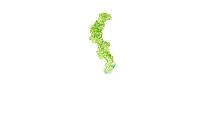

In [7]:
EcobjectWebLayer = weblayer_search[0]
EcobjectWebLayer

In [8]:
from arcgis.mapping import WebMap
LTW = gis.map('Homewood, CA', zoomlevel = 10)
LTW.basemap= 'hybrid'
LTW


MapView(basemaps=['dark-gray', 'dark-gray-vector', 'gray', 'gray-vector', 'hybrid', 'national-geographic', 'oc…

## Indicator of Disturbance Analysis

### 1. Mean Condition Class (Mean Fire Return Interval Departure Condition Class)
Mean Condition Class is based on Fire Return Interval Departure data for condition class (Safford et al. 2011). These data quantify the difference between current and pre-settlement fire frequencies, allowing managers to target areas at high risk based on where natural fire cycles have been missed. Fire interval departure gives us an idea of where uncharacteristic fuels loads and tree densities may exist on the landscape. Areas further departed may have higher fuel loadings and are less resilient to fire, and potentially to drought as well.

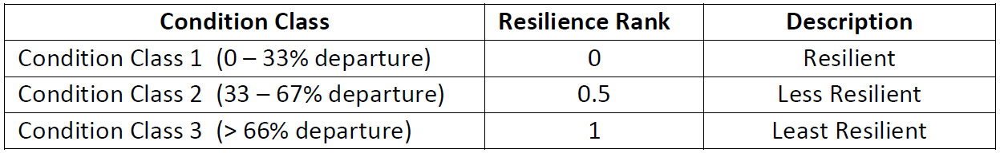

#### Analysis

In [12]:
# perfomr zonal stats to join Fire Return Interval data to Ecobject data and calculate the resilence score
arcpy.FeatureToRaster_conversion( projectgdb + '/FRID_NorthSierra15_1_LTW', "meanCC_FRI", 'FRID_grid', 5)
# Set local variables
inZoneData = Ecobject
zoneField = "Ecobject_ID"
inValueRaster = 'FRID_grid'
outTable = "ZonalStat_Ecobject_FRID.dbf"
# Execute ZonalStatisticsAsTable
outZSaT = arcpy.sa.ZonalStatisticsAsTable(inZoneData, zoneField, inValueRaster, outTable, "NODATA", "MAJORITY")

ExecuteError: Failed to execute. Parameters are not valid.
ERROR 000872: Output raster: Dataset C:/GIS/PROJECT/LakeTahoeWest/Data/AnalysisData.gdb\FRID_grid already exists and cannot be overwritten since the Overwrite existing datasets option is disabled.
Failed to execute (FeatureToRaster).


In [ ]:
#create dictionary
#Key: join field
#Value: field with value to be transferred
outTable = 'C:/GIS/PROJECT/LakeTahoeWest/Data/AnalysisData.gdb/ZonalStat_Ecobject_FRID'
valueDict = dict ([(key, val) for key, val in SearchCursor(outTable, ["Ecobject_ID", "MAJORITY"])])
updateFld = 'meanCC_FRID' 
IdFld = 'EcObject_ID'
#update Ecobject feature class
with UpdateCursor (Ecobject, [updateFld, IdFld]) as cursor:
    for update, key in cursor:
        #skip if key value is not in dictionary
        if not key in valueDict:
            continue
        #create row tuple
        row = (valueDict [key], key)
        #update row
        cursor.updateRow (row)
del cursor

In [6]:
fields = ['meanCC_FRID', 'CC_Resilience_Rank']
# Create update cursor for feature class 
with UpdateCursor(Ecobject, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if row[0] == 1:
            row[1] = 0
        elif row[0] == 2:
            row[1] = 0.5
        elif row[0] == 3:
            row[1] = 1
        elif row[0] == -999:
            row[1] = None
        elif row[0] == -2:
            row[1] = None
        cursor.updateRow(row)
    del cursor

#### Results

In [13]:
fields = ['Acres', 'CC_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY CC_Resilience_Rank ASC')) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y, marker=dict(color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'], line=dict(color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'], width=1.5,)),opacity=0.8)]
layout = go.Layout(xaxis=dict(title='Resilience Score', autotick=False, ticks='outside', tick0=0, dtick=0.5, ticklen=8, tickwidth=2, tickcolor='#000'), yaxis=dict(title='Acres'))
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 2. Fire Severity (Wildfire High Severity Patch Size)
Fire severity patch size identifies areas on the landscape that are more or less prone to large patches of high severity fire and high tree mortality if a wildfire should burn in that area. Large patches of high severity fire removes mid- and late-seral forest characteristics which degrades the resilience of these ecosystems and the value of wildlife habitat, and places such ecosystems on uncharacteristic trajectories (e.g. transitioning from a forest to a shrub ecosystem).
Fire modeling based on the fire simulator was used to evaluate high severity patch size. The Design Team assumed that anything over a six foot flame length may be a high severity fire. (See Appendix A for additional methodological information).
Resilient Condition (0): High severity patch sizes are less than or equal

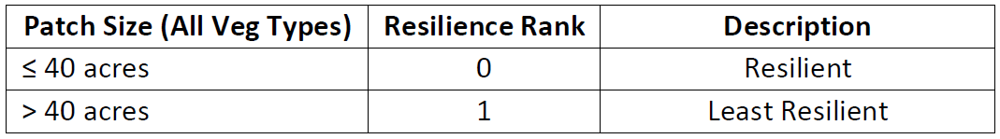

#### Analysis

In [2]:
import arcpy

arcpy.env.workspace('C:\GIS\PROJECT\LakeTahoeWest\Data\Dev.gdb')
fil4 = Raster('C:\GIS\PROJECT\LakeTahoeWest\Data\ProjectData.gdb\iCBP_FIL6_ltw_area')
fil5 = Raster('C:\GIS\PROJECT\LakeTahoeWest\Data\ProjectData.gdb\iCBP_FIL6_ltw_area')
fil6 = Raster('C:\GIS\PROJECT\LakeTahoeWest\Data\ProjectData.gdb\iCBP_FIL6_ltw_area')

fil456= Raster('fil4')+Raster('fil5')+Raster('fil6')

reclassFIL456 = Reclassify('fil456', "Value", RemapRange([[0,0.001]]))

arcpy.RasterToPolygon_conversion("zone", "c:/output", "NO_SIMPLIFY", "VALUE")



ModuleNotFoundError: No module named 'arcpy'

#### Results

In [8]:
fields = ['Acres', 'FireSeverity_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y, marker=dict(color=['rgb(40,146,199)', 'rgb(232,16,20)'], 
                line=dict(color=['rgb(0,76,115)', 'rgb(168,0,0)'], width=1.5,)), opacity=0.8)]
layout = go.Layout(xaxis=dict(title='Resilience Score', 
                    autotick=False, ticks='outside', tick0=0, dtick=1, ticklen=8, tickwidth=2,tickcolor='#000'),
                yaxis=dict(title='Acres'))
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 3. Trees per Acre
Trees per acre (TPA) is an indicator of resilience of upland forests and in some cases meadow/riparian ecosystems to fire, insects, disease, drought and climate change. In general, as forests become more dense (e.g., more TPA), they are less resilient to various disturbances. The acceptable resilient condition for the TPA indicator came from the published literature sources for historic and contemporary reference conditions. The range of resilience does not include associated information on tree size classes or forest seral stages. This metric does not include saplings and seedlings. (See appendix A for additional methodological information).

Resilient Condition (0): The number of trees per acre is similar to the mean of historic and/or contemporary reference data for the five vegetation types for which data are available.

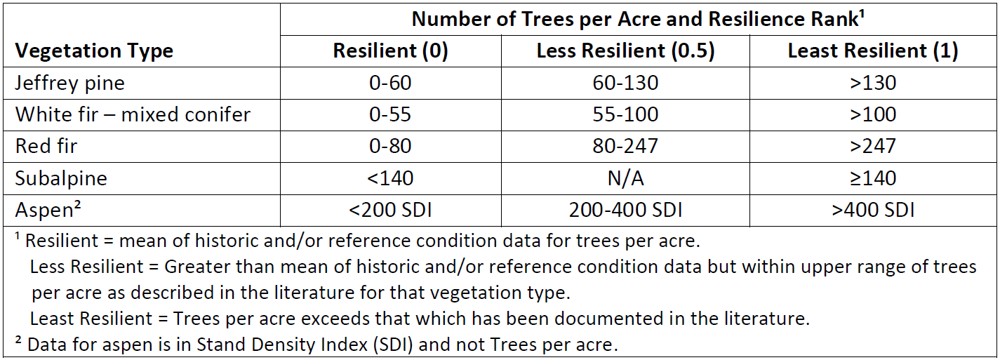

#### Analysis

In [4]:
fields = ['pTree_Count_acre', 'REGIONAL_DOMINANCE_TYPE_1', 'SDI', 'TreesPerAcre_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == 'JP' and row[0] >= 0 and row[0] <= 30):
            row[3] = 0
        elif (row[1] == 'JP' and row[0] > 30 and row[0] <= 100):
            row[3] = 0.5
        elif (row[1] == 'JP' and row[0] > 100):
            row[3] = 1
        # TPA Ranges for Mixed Conifer-Fir
        if (row[1] == 'MF' and row[0] >= 0 and row[0] <= 25):
            row[3] = 0
        elif (row[1] == 'MF' and row[0] > 25 and row[0] <= 70):
            row[3] = 0.5
        elif (row[1] == 'MF' and row[0] > 70):
            row[3] = 1
        # TPA Ranges for Red Fir
        if (row[1] == 'RF' and row[0] >= 0 and row[0] <= 50):
            row[3] = 0
        elif (row[1] == 'RF' and row[0] > 50 and row[0] <= 217):
            row[3] = 0.5
        elif (row[1] == 'RF' and row[0] > 217):
            row[3] = 1
        # TPA Ranges for Sub-Alpine
        if (row[1] == 'SA' and row[0] >= 0 and row[0] <= 110):
            row[3] = 0
        elif (row[1] == 'SA' and row[0] > 110):
            row[3] = 1
        # TPA Ranges for Aspen
        if (row[1] == 'QQ' and row[2] >= 0 and row[2] <= 200):
            row[3] = 0
        elif (row[1] == 'QQ' and row[0] > 200 and row[0] <= 400):
            row[3] = 0.5
        elif (row[1] == 'QQ' and row[0] > 400):
            row[3] = 1
        # TPA Ranges for White Fire
        if (row[1] == 'WF' and row[0] >= 0 and row[0] <= 25):
            row[3] = 0
        elif (row[1] == 'WF' and row[0] > 25 and row[0] <= 70):
            row[3] = 0.5
        elif (row[1] == 'WF' and row[0] > 70):
            row[3] = 1
        # Update the cursor with the updated list
        cursor.updateRow(row)

#### Results

In [5]:
fields = ['Acres', 'TreesPerAcre_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause = (None, 'ORDER BY TreesPerAcre_Resilience_Rank ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 4. Meadow Refugia
Meadows that are well connected and provide future climate refugia may be more resilient to future disturbances and would potentially provide more stable habitat for terrestrial and aquatic species. Refugia is defined as areas on the landscape where the magnitude of change in climate and climate-derived measures was minimal, as measured from a baseline period of 1910–1939 and focused on temperature, precipitation, and water balance variables (Maher et al. 2017). The Design Team focused on evaluating refugia based on minimum temperature (2010-2039) and annual precipitation from modeled from the GFDL-A2 (warmer and drier climate scenario) (Maher et al. 2017). (See appendix A for additional methodological information).

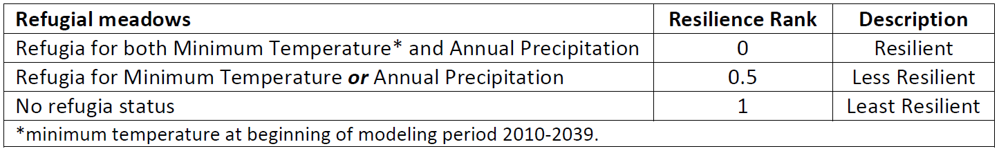

#### Analysis

In [ ]:
arcpy.SpatialJoin_analysis(Ecobject, Meadows, Ecobject_Meadow, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Meadow Refugia Spatial Join")

# Join and Calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'MeadowRefugia', Ecobject, 'Ecobject_ID', 'GFDLA2')

# rank resilience
fields = ['', '', '', 'MeadowRefugia_RR']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [6]:
fields = ['Acres', 'MeadowRefugia_RR']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause = (None, "ORDER BY MeadowRefugia_RR ASC")) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 5. Meadow Connectivity
Meadows that are well connected and provide future climate refugia may be more resilient to future disturbances and would potentially provide more stable habitat for terrestrial and aquatic species. All meadows were evaluated for the connectivity in terms of distance, topography, water courses, and roads and trails based on Morelli et al. (2016) and Moher et al. (2017). (See appendix A for additional methodological information).

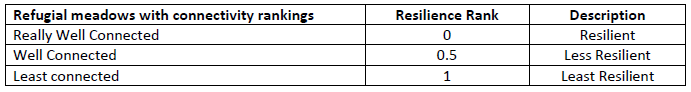

#### Analysis

In [ ]:
arcpy.SpatialJoin_analysis(Ecobject, MeadowConnect, Ecobject_MeadowConnect, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Meadow Connectivity Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'MeadowConnectivity', Ecobject, 'Ecobject_ID', '')

# rank resilience
fields = ['', '', '', 'MeadowConnectivity_RR']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [13]:
fields = ['Acres', 'MeadowConnectivity_RR']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause = (None, "ORDER BY MeadowConnectivity_RR ASC")) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 6. Thermal Tolerance
The California Spotted Owl is sensitive to temperatures at or above 300C at which point body temperature elevates and body width index (piloerection) increases. At temperatures at or above 320C breathing rate increases. At temperatures at or above 340C, gular fluttering, gaping, and drooping of the wings occurs. The upper critical temperature for the California Spotted Owl is 35.20C, where resting metabolic rate increases exponentially (Weathers et al. 2001). Data for spotted owl thermal tolerance may be extrapolated as a threshold to other wildlife species, where there is limited data. Also, these data can inform what may happen to the owl population as well as their prey as temperature warms.
The Interagency Design Team used data for the 2025 projected median value of the total number of days between May through September for which the daily maximum temperature exceeded the threshold temperature of 30°C based on an ensemble of 10 global climate models and the RCP 4.5 emission scenario. (See Appendix A for additional methodological information).

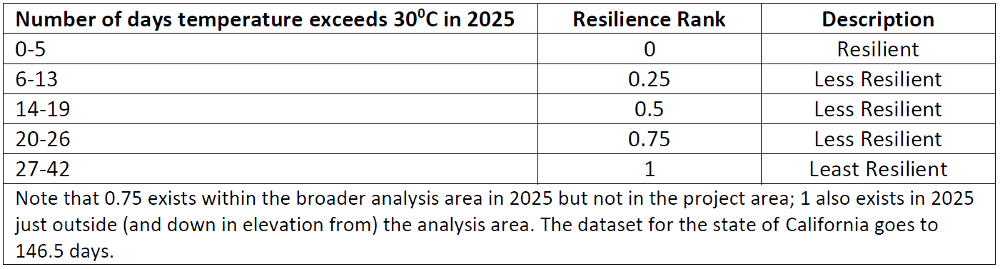

#### Analysis

In [ ]:
# Set local variables
inZoneData = "LTW_Ecobject"
zoneField = "Ecobject_ID"
inValueRaster = "LTW_ThermalTolerance_2015" 

# Execute ZonalStatistics
outZonalStatistics = ZonalStatistics(inZoneData, zoneField, inValueRaster, "MEAN", "NODATA")

# Save the output 
outZonalStatistics.save("C:/GIS/PROJECT/LakeTahoeWest/Data/AnalysisData.gdb/ZonalStat_Ecobject_ThermalTolerance")

# Join and Calc
fieldJoinCalc(outZonalStatistics, 'Ecobject_ID', 'ThermalTolerance', Ecobject, 'Ecobject_ID', 'grid')

# rank resilience
fields = ['', '', '', 'ThermalTolerance_RR']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [14]:
fields = ['Acres', 'ThermalTolerance_RR']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause = (None, "ORDER BY ThermalTolerance_RR ASC")) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(160, 194, 155)', 'rgb(250,250,100)', 'rgb(27, 79, 98)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(160, 194, 155)', 'rgb(230,230,0)',  'rgb(27, 79, 98)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.25,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 7. Climatic Water Deficit
Climatic Water Deficit (CWD) is a measure of plant stress. It is calculated as the difference between actual and potential evapotranspiration, which is limited by soil moisture availability. Multiple studies have demonstrated the sensitivity of ecosystems to climatic water deficit, which is a measure of water stress. Ecosystems with lower CWD are more resilient to ecosystem disturbance (e.g. climate change, insects and disease, fire, etc.). Recent work has shown a strong connection between resilience of drought induced beetle mortality and climatic water deficit (e.g., Restaino et al. 2017).
The Design Team used climatic water deficit for 2015, which was a significant drought year, from the California Basin Characterization Model (Flint, Lorraine E., Alan L. Flint, org: USGS). This dataset provides historical and projected climate and hydrologic surfaces for the state of California and all the streams that flow into it. (See Appendix A for additional methodological information).

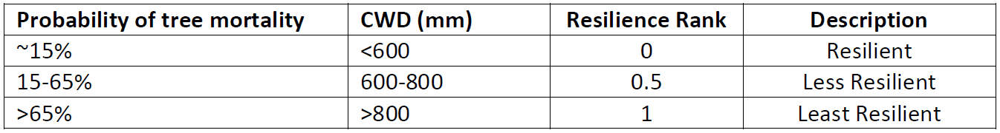

#### Analysis

In [ ]:
# Set local variables
inZoneData = "LTW_Ecobject"
zoneField = "Ecobject_ID"
inValueRaster = "LTW_CWD_2015" 

# Execute ZonalStatistics
outZonalStatistics = ZonalStatistics(inZoneData, zoneField, inValueRaster,"MEAN", "NODATA")

# Save the output 
outZonalStatistics.save("C:/GIS/PROJECT/LakeTahoeWest/Data/AnalysisData.gdb/ZonalStat_Ecobject_CWD")

# Join and Calc
fieldJoinCalc(outZonalStatistics, 'Ecobject_ID', 'ThermalTolerance', Ecobject, 'Ecobject_ID', 'grid')

# rank resilience
fields = ['', '', '', 'ThermalTolerance_RR']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [15]:
fields = ['Acres', 'CWD_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause=(None,'ORDER BY CWD_Resilience_Rank ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 8. Snowpack 
Snowpack changes are a well-documented, key indicator of resilience to climate change. Snowpack is important to both ecosystem processes and various human resources such as drinking water. The Design Team used the California Basin Characterization Model (Flint, Lorraine E., Alan L. Flint, org: USGS) to identify where there was snow on April 1, 2015. Typically, April 1st marks the start of significant snowmelt, which is an important measure for recharge of lakes, streams, and groundwater dependent ecosystems. 2015 was a significant drought year, so the areas with snow on April 1 represent the potentially most resilient locations. All areas with any snow on that date were considered resilient, while all areas without snow on that date were considered least resilient. (See appendix A for additional methodological information).

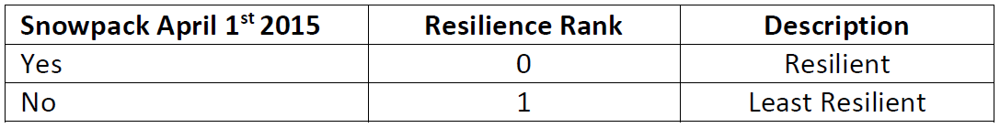

#### Analysis

In [ ]:
# Set environment settings
env.workspace = "C:/GIS/PROJECT/LakeTahoeWest/Data/ProjectData.gdb"

# Set local variables
inZoneData = "LTW_Ecobject"
zoneField = "Ecobject_ID"
inValueRaster = "LTW_Snowpack_2015" 

# Execute ZonalStatistics
outZonalStatistics = ZonalStatistics(inZoneData, zoneField, inValueRaster, "MAJORITY", "NODATA")

# Save the output 
outZonalStatistics.save("C:\GIS\PROJECT\LakeTahoeWest\Data\AnalysisData.gdb\ZonalStat_Ecobject_Snowpack")

# Join and Calc
fieldJoinCalc(outZonalStatistics, 'Ecobject_ID', 'Snowpack', Ecobject, 'Ecobject_ID', 'grid')

# rank resilience
fields = ['', '', '', 'Snowpack_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [16]:
fields = ['Acres', 'Snowpack_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 9. Fire Risk Index
The Modified Fire Risk Index measures the relative risk of human populations and infrastructure (values at risk) to the threat of wildland fire. The fire risk index combines an estimate of the probability of an area being threatened by wildfire (fire threat) and an estimate of the values that would be damaged by a wildfire at the predicted severity (fire effects). The Modified Fire Risk Index measures the relative resilience of the public health and safety values to wildland fire. The Fire Risk Index was developed through the West Wide Wildfire Risk Assessment Project in 2014. It combines inputs including the locations of human populations and infrastructure, probability of ignitions, probable fire behavior, historic weather patterns, and local suppression capability. Fire Risk Index was weighted by the canopy cover slices from EcObject and LANDFIRE vegetation condition class for the Modified Fire Risk Index.
Modified Fire Risk Index values are relative to other areas in the landscape, therefore the acceptable resilient conditions were defined based on quantiles, and then compared to established Wildland Urban Interface boundaries. (See Appendix A for additional methodological information).

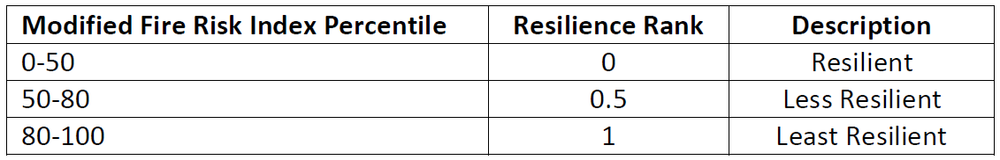

#### Analysis

In [2]:
fields = ['CC_Mult_FRI', 'FireRisk_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(Ecobject, fields) as cursor:
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[0] <= 5.07):
            row[1] = 0
        elif (row[0] > 5.07 and row[0] <= 120.84):
            row[1] = 0.5
        elif (row[0] > 120.84):
            row[1] = 1
        # Update the cursor with the updated list
        cursor.updateRow(row)
    del cursor

#### Results

In [17]:
fields = ['Acres', 'FireRisk_Resilience_Rank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 10. Roads and Trails Linked to Water Channels
This indicator is intended to give a general indication of resilience to water quality impacts from flooding. For the purposes of this Assessment, a crossing with a culvert is considered more resilient than a crossing without a culvert. Channel crossings on roads and trails that have functioning culverts can reduce the potential for sediment loading where the intersection occurs. Due to data limitations, this
Landscape Resilience Assessment v.1 10
Lake Tahoe West 12/11/17
indicator does not consider whether or not the culvert is adequately sized or functioning. However, all crossings without a culvert were ranked as 1, least resilient.
Also, this indicator does not consider that crossings may be rock armored or have other appropriate best management practices (BMPs) in place that would make it more resilient. In future phases when more data may be available, this desired resilient condition may be revised to state that these intersections have sufficient BMPs (and not necessarily a culvert) to reduce sedimentation potential. (See appendix A for a figure representing spatial data used to evaluate resilience).

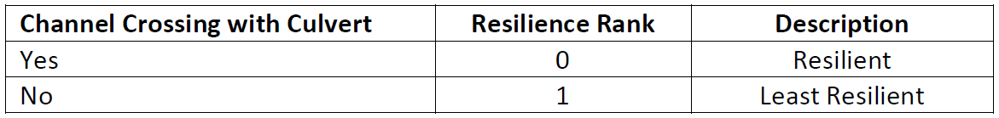

#### Analysis

In [ ]:
arcpy.SpatialJoin_analysis(Ecobject, Culverts, Ecobject_Culvert, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Stream Crossing Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'StreamXing', Ecobject, 'Ecobject_ID', 'Culvert')

# rank resilience
fields = ['', '', '', 'RoadTrailWaterChannel_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [18]:
fields = ['Acres', 'RoadTrailWaterChannel_Resilience_Rank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(232,16,20)'],
        line=dict(
            color=['rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 11. Human Access
This indicator is intended to identify areas of the landscape that are most impacted by noise and other impacts associated with human presence and use. These areas are more vulnerable to the introduction of invasive species associated with human activities and are less likely to be used by wildlife species that are sensitive to human presence. Human access is generally concentrated on roads and trails. Therefore, it is assumed that areas closest to roads and trails are less resilient in terms of human presence than areas further from roads and trails. The further from concentrated human use, the more resilient the landscape condition. This is where the most sensitive species to humans have suitable habitat, as large ranging, specialized species (e.g., spotted owl, northern goshawk and American marten) can be especially sensitive to noise associated with human presence.
The Design Team classified trail and road buffers as described in the table below. This indicator is based on data provided in the TRPA-managed spatial information for impervious coverage.

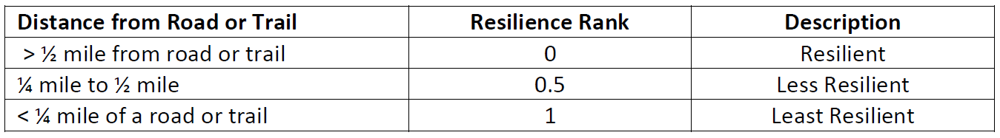


#### Analysis

In [ ]:
arcpy.SpatialJoin_analysis(Ecobject, RoadBuffer, Ecobject_RoadBuffer, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Stream Crossing Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'RoadBuffer', Ecobject, 'Ecobject_ID', 'RoadBuf')

# rank resilience
fields = ['', '', '', 'HumanAccess_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [19]:
fields = ['Acres', 'HumanAccess_Resilience_Rank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY HumanAccess_Resilience_Rank ASC')) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 12. Water Quality
This indicator provides an indication of which portions of the landscape are susceptible to increased erosion and sediment loading to water bodies from disturbance. Such disturbances primarily include human activity, fire, and flooding. The water quality indicator is based upon the Bailey’s Land Capability Classification System (Bailey 1974). The system combines hazard ratings based upon soil type, slope, infiltration rates, and a hazard rating based upon geomorphic setting to assign a land capability score, ranked 1-7, with the lowest ranking broken into three categories (1a, 1b, and 1c). These rankings represent the relative tolerance to human disturbance. The Design Team assigned a value to each
Landscape Resilience Assessment v.1 11
Lake Tahoe West 12/11/17
ranking based upon the relative hazard (high, moderate, or low hazard lands, and the value of allowable disturbance for each) as shown below.
For this indicator, resilience is ranked according to sensitivity to human disturbance, specifically creation of impervious coverage, because these areas create long lasting impacts on the landscape. (See appendix A for additional methodological information).

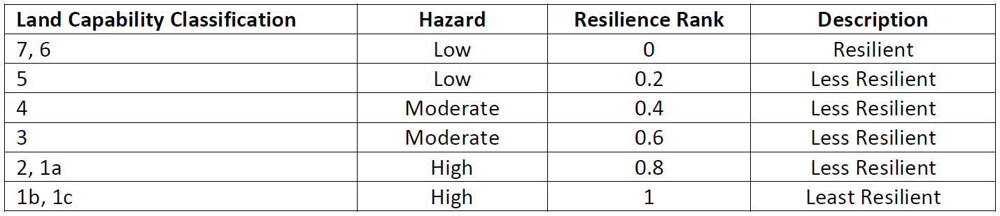

#### Analysis

In [ ]:
LandCap = "NRCS_2007"
arcpy.SpatialJoin_analysis(Ecobject, LandCap, Ecobject_LandCap, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Water Qualitys Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'LandCap', Ecobject, 'Ecobject_ID', 'LandCap')

# rank resilience
fields = ['', '', '', 'ErosionPotential_ResilienceRank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > and row[0] <= ):
            row[3] = 0.5
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [20]:
fields = ['Acres', 'ErosionPotential_ResilienceRank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY ErosionPotential_ResilienceRank ASC')) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(160, 194, 155)', 'rgb(250,250,100)', 'rgb(27, 79, 98)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(160, 194, 155)', 'rgb(230,230,0)',  'rgb(27, 79, 98)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.2,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 13. Aquatic Organism Passage
This indicator measures the presence of man-made barriers to fish passage in streams in the LTW project area. Streams with no man-made barriers are assumed to have a higher amount of aquatic organism connectivity. These streams are considered more resilient because aquatic organisms are able to move throughout the stream to find refugia in times of drought or climate change.
The Design Team examined which barriers are prohibitive to sculpin movement, the lowest barrier threshold for native fish. Sculpin were selected as the threshold because they are native to these creeks and are relatively weak swimmers (limited jumping ability to get over barriers). Therefore, if sculpin have made it up the creek then one can assume that most other fish that comprise the food web are present as well. Barriers impede movement and connectivity in the stream, thus only streams with no barriers to sculpin passage were considered resilient. (See Appendix A for a data caveat).

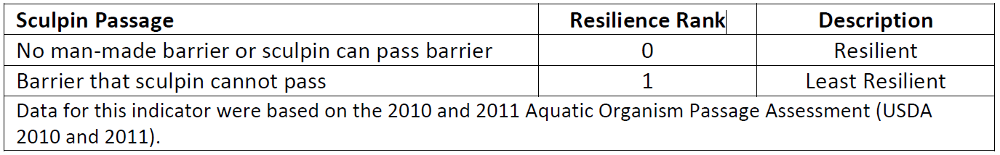

#### Analysis

In [ ]:
AOP= "AOP"
arcpy.SpatialJoin_analysis(Ecobject, AOP, Ecobject_AOP, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the AOP Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'AOP', Ecobject, 'Ecobject_ID', 'AOP')

# rank resilience
fields = ['', '', '', 'AOP_ResilienceRank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [21]:
fields = ['Acres', 'AOP_RR']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY AOP_RR ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 14. Floodplain Condition
The extent of floodplain encroachment addresses the resilience of meadow/riparian and aquatic ecosystems to flood, drought, climate change, and erosion. In addition, it addresses the resilience of public health & safety and recreation to flooding. While the majority of the landscape is not assessed with this metric, it is key to understanding the health and resilience of meadow/riparian ecosystems. The encroachment of impervious coverage impedes the ability of floodplains to perform their natural processes. Processes include flood- and base-flow attenuation as well as filtration and sediment capture for water quality benefits. Structures built within floodplains are more likely to be damaged by flooding, and are therefore less resilient than buildings above the floodplain.
This indicator is currently assessed as the areas within the FEMA 100 year floodplain, or TRPA defined Stream Environment Zone (SEZ, Bailey class 1b) that contain impervious surfaces, including structures, roads, and trails.

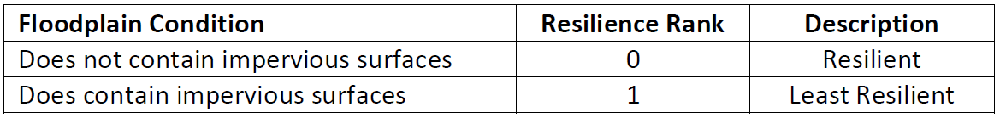

#### Analysis

In [ ]:
FloodPlain= "NRCS_2007"
arcpy.SpatialJoin_analysis(Ecobject, FloodPlain, Ecobject_FloodPlain, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Water Qualitys Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'FloodPlain', Ecobject, 'Ecobject_ID', 'FloodPlain')

# rank resilience
fields = ['', '', '', 'FloodPlain_ResilienceRank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [22]:
fields = ['Acres', 'FloodplainConnect_Resilience_Rank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY FloodplainConnect_Resilience_Rank ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 15. Bark Beetle Predators
The resilience of a forest system is influenced by factors other than forest structure and disturbance dynamics. Many species and groups of species play important functional roles and, under changing environmental conditions, species with previously minimal functional responsibilities may take on increasingly important functional roles. The persistence of these functional groups is essential for ecosystem resilience. One functional group that plays a very important role in ecosystem resilience in the Lake Tahoe Basin is the cavity nesting bird guild that acts as primary predators on bark beetles and other potentially disruptive forest insects, including non-native insect pests.
Cavity nesting birds are important predators on bark beetles, which have contributed to recent conifer die-off events in the Lake Tahoe Basin and Sierra Nevada. These birds act as a biological control agent to moderate and reduce the effects of insect outbreaks and promote forest resilience to drought, insects, and climate change (Fayt et al., 2005). The suite of forest cavity nesters may moderate the onset, distribution, duration, or intensity of outbreaks by delaying the initiation of an outbreak and/or increasing the trajectory of decline after the peak of the outbreak (Martin et al. 2006). This moderation could result in a substantial decline in total tree mortality during a drought-induced beetle outbreak.
The Design Team ranked the resilience for this indicator based data developed by White and Manley (2013). Fourteen probability of occurrence rasters were averaged and Jenks natural breaks were generated to assign a resilience rank. (See Appendix A for additional methodological information).

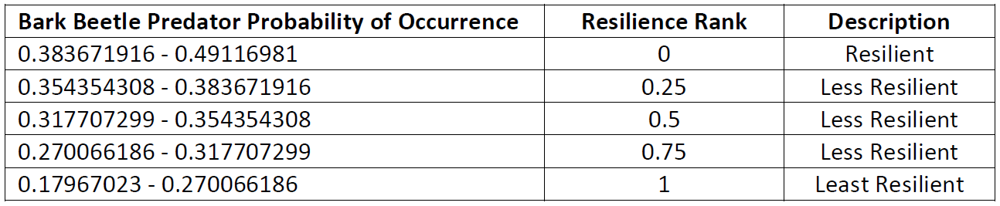

#### Analysis

In [ ]:
# Set local variables
inZoneData = "LTW_Ecobject"
zoneField = "Ecobject_ID"
inValueRaster = "LTW_Snowpack_2015" 

# Execute ZonalStatistics
outZonalStatistics = ZonalStatistics(inZoneData, zoneField, inValueRaster, "MAJORITY", "NODATA")

# Save the output 
outZonalStatistics.save("C:\GIS\PROJECT\LakeTahoeWest\Data\AnalysisData.gdb\ZonalStat_Ecobject_Snowpack")

# Join and Calc
fieldJoinCalc(outZonalStatistics, 'Ecobject_ID', 'BarkBeetle', Ecobject, 'Ecobject_ID', 'grid')

# rank resilience
fields = ['', '', '', 'Snowpack_Resilience_Rank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [23]:
fields = ['Acres', 'Wildlife_Resilience_Rank']
dictKeyAcre={}

with SearchCursor(Ecobject, fields, sql_clause = (None, "ORDER BY Wildlife_Resilience_Rank ASC")) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(160, 194, 155)', 'rgb(250,250,100)', 'rgb(250, 141, 52)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(112, 168, 0)', 'rgb(230,230,0)',  'rgb(230, 152, 0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.25,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 16. Native Fish Diversity
The presence and diversity of native fish species in a stream is an indicator of habitat quality, connectivity, and complexity – essentially, more native species from multiple trophic levels indicates a more resilient stream. Streams with a greater ratio of native species than non-native species are more resilient to disturbances. For this indicator only streams that have more native species than non-native species are considered resilient (this indicator is focused on species diversity and does not incorporate abundance into the resilience rank). (See appendix A for additional methodological information).

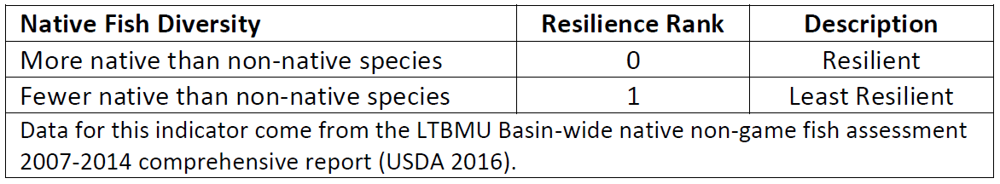

#### Analysis

In [ ]:
FishAssess= ""
arcpy.SpatialJoin_analysis(Ecobject, FishAssess, Ecobject_FloodPlain, "JOIN_ONE_TO_ONE", "KEEP_ALL", fieldMappings, "HAVE_THEIR_CENTER_IN", "", "")
print ("Finished the Water Qualitys Spatial Join")

# join and calc
fieldJoinCalc(Ecobject_Meadow, 'Ecobject_ID', 'FloodPlain', Ecobject, 'Ecobject_ID', 'FloodPlain')

# rank resilience
fields = ['', '', '', 'FloodPlain_ResilienceRank']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [24]:
fields = ['Acres', 'NativeFish_RR']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause = (None,'ORDER BY NativeFish_RR ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)','rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 17. Seral Stage
Percent of seral stage across the landscape is an indicator of resilience of upland forest and in some cases meadow/riparian ecosystem to fire, insects, disease, drought and climate change. Seral stage was developed based on tree size classes and canopy cover, both of which can affect competition, fire behavior, susceptibility to pest infestations, etc. Additionally, this indicator provides information related to heterogeneity, which ties to the resilience of wildlife habitat.
For this indicator two data sources were used: desired conditions from the LTBMU Forest Plan (USDA 2016) and the Yuba River Historic Range of Variation analysis, which was summarized by Becky Estes in the draft South Fork American River Desired Conditions. Due to differences in seral classifications, cut-offs incorporated the larger end of the upper and lower range to provide a more liberal range. (See appendix A for additional methodological information).

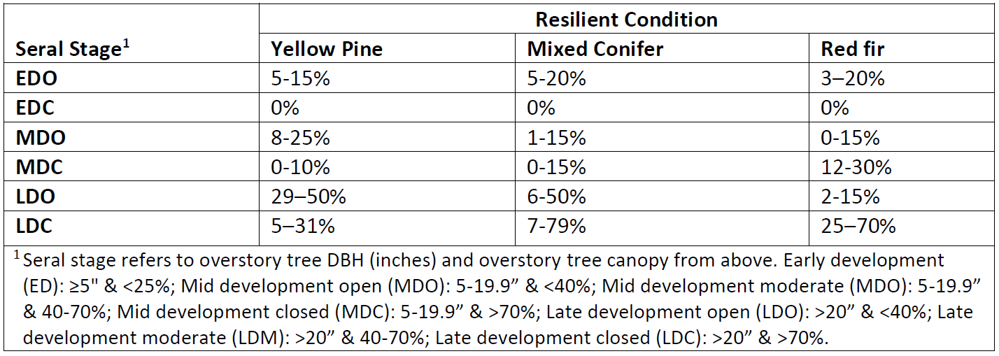

#### Analysis

In [ ]:
# clsssify seral class
fields = ['', '', '', 'Seral_Class']
# Create update cursor for feature class 
with arcpy.da.UpdateCursor(fc, fields) as cursor:
    # For each row, evaluate the field value (index position 
    # of 0, 1, and 2), and update field value (index position of 3)
    for row in cursor:
        # TPA Ranges for Jeffery Pine
        if (row[1] == '' and row[0] >= and row[0] <= ):
            row[3] = 0
        elif (row[1] == '' and row[0] > ):
            row[3] = 1

#### Results

In [25]:
fields = ['Acres', 'Seral_Class']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause = (None, 'ORDER BY Seral_Class ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(255,255,190)', 'rgb(230,200, 0)', 'rgb(112, 168, 0)', 'rgb(76, 115, 0)', 'rgb(230,152,0)', 'rgb(168 112, 0)' ],
        line=dict(
            color=['rgb(255,255,190)', 'rgb(230,200, 0)', 
               'rgb(112, 168, 0)', 'rgb(76, 115, 0)', 'rgb(230,152,0)', 'rgb(168 112, 0)' ],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Seral Class',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 18. Vertical Heterogeneity 
Spatial patterns are important resilience indicators because they influence disturbance behavior, regeneration, snow retention, and habitat quality. Unfortunately, there is limited reference information identifying resilient conditions. Vertical heterogeneity was evaluated using Illilouette Basin reference sites.
The resilient conditions for each vertical heterogeneity class focus on the ranks and use the percentile range as a guide. (See appendix A for additional methodological information).

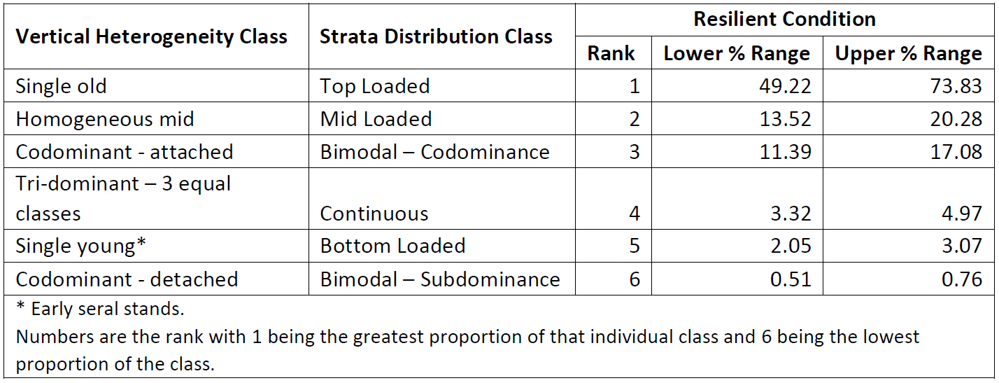

#### Results

In [26]:
fields = ['Acres', 'Strata_Dis']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8
)]
layout = go.Layout(
    xaxis=dict(
        title='Vertical Heterogeneity',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres',
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 19. Horizontal Heterogeneity 
Similar to vertical heterogeneity, horizontal heterogeneity spatial patterns are important resilience indicators because they influence disturbance behavior, regeneration, snow retention, and habitat quality. Heterogeneity across the landscape will increase landscape resilience. Two data sources were used to evaluate horizontal heterogeneity: 1) Illilouette Basin reference sites and 2) data from (Lydersen et al. 2013). These two sources allowed the Design Team to bracket the range of resilient conditions presented below. The resilient conditions for horizontal heterogeneity was further evaluated by landscape management unit (ridge, canyon, NE and SW slopes). (See Appendix A for additional methodological information).

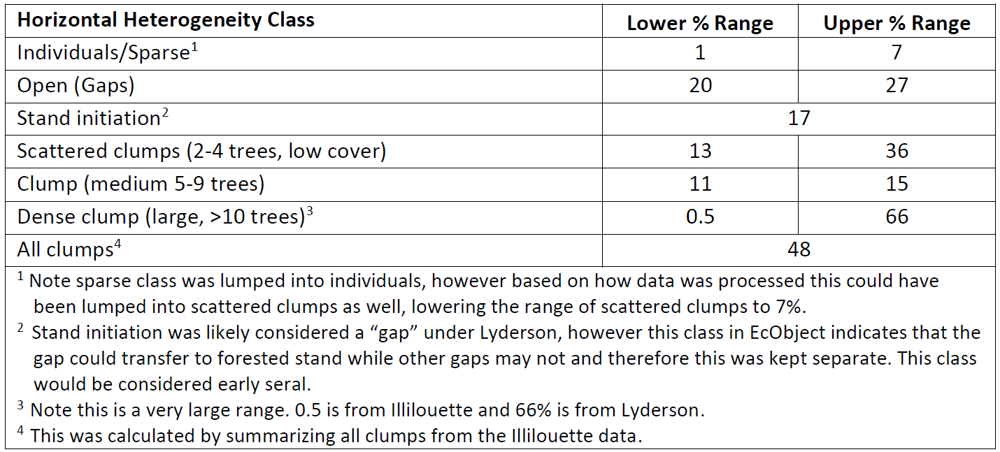

#### Results

In [27]:
fields = ['Acres', 'SpatialVar']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=1,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 20. Treatment Type
Although mean condition class (indicator #1 above) describes the difference between current and pre-settlement fire frequencies, management actions such as small prescribed fires may not have been captured in the Fire Return Interval Departure (Indicator 1). Additionally, although fire is a unique tool that thinning alone cannot replicate completely, thinning activities are important for increased resilience. The land managers have conducted thinning operations that are not captured by the Fire Return Interval Departure dataset. These treatments are important to visually illustrate on a map but do not tell us if these treated areas are now resilient (or conversely, that untreated areas are not resilient). Therefore, this indicator is intended to be used as a visual overlay on a map (Appendix B).
Data were incorporated for all treatments conducted within the last 10 years. The Design Team assumed that treatments older than 10 years may have been implemented differently than current treatments (data quality may be lower for older data) and may not be as resilient due to the longevity of different treatments – especially in relation to fire return interval. Data are the best available data from state and federal agencies. (See Appendix A for additional methodological information).

#### Results

In [28]:
fields = ['Acres', 'Treatment_ResilienceRank']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields, sql_clause=(None, 'ORDER BY Treatment_ResilienceRank ASC')) as cursor:
    for row in cursor:
        if row[1] == None:
            continue
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### 21. Vegetation Type
A diverse representation of vegetation types across the landscape will increase resilience to fire, insects, disease and drought because different vegetation communities respond differently to type and magnitude of disturbance. More diverse vegetation types also translate into more habitat types for wildlife diversity.
Two spatial datasets (Landfire and VTM) suggestive of the historical range of variability were used to bracket the percentage of each vegetation type. These data can be used to compare current proportions of each vegetation type to historic conditions, however these data cannot be used to identify which location of each vegetation type is within or outside of resilient condition. Therefore this indicator is not used to evaluate spatial resilience but may be used to represent overall proportional resilience. This indicator is spatially presented in terms of which vegetation types are found in the LTW project area and where each type is found (Appendix B). (See Appendix A for additional methodological information).

#### Results

In [29]:
fields = ['Acres', 'REGIONAL_DOMINANCE_TYPE_1']
dictKeyAcre={}

with arcpy.da.SearchCursor(Ecobject, fields) as cursor:
    for row in cursor:
        if row[1] in dictKeyAcre:
            currentCount = dictKeyAcre[row[1]]
            dictKeyAcre[row[1]] = currentCount + row[0]
        else:
            dictKeyAcre[row[1]] = row[0]
x = []
y = []
for resscore in dictKeyAcre:
    x.append(resscore)
    y.append(dictKeyAcre[resscore])

data = [go.Bar(x=x, y=y,
    marker=dict(
        color=['rgb(40,146,199)', 'rgb(250,250,100)', 'rgb(232,16,20)'],
        line=dict(
            color=['rgb(0,76,115)', 'rgb(230,230,0)', 'rgb(168,0,0)'],
            width=1.5,
        )
    ),
    opacity=0.8, 
)]
layout = go.Layout(
    xaxis=dict(
        title='Resilience Score',
        autotick=False,
        ticks='outside',
        tick0=0,
        dtick=0.5,
        ticklen=8,
        tickwidth=2,
        tickcolor='#000'
    ),
    yaxis=dict(
        title='Acres', hoverformat='0.r'
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='basic-bar')

### References

#### Reclassify a Raster
#### http://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/reclassify.htm
#### https://www.e-education.psu.edu/geog485/node/138

#### Majority Filter
#### http://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/majority-filter.htm

#### Zonal Statistics
#### http://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/zonal-statistics.htm